In [ ]:
# -------------------------
# SegFormer (ADE20K)
# -------------------------
print("\nRunning SegFormer (ADE20K)...")
# The following lines are moved to cell UeYZ4x_vYoiY
# feature_extractor = SegformerFeatureExtractor.from_pretrained("nvidia/segformer-b0-finetuned-ade-512-512")
# model_segformer = SegformerForSemanticSegmentation.from_pretrained("nvidia/segformer-b0-finetuned-ade-512-512")
# model_segformer.eval()


Running SegFormer (ADE20K)...


In [ ]:
from torch.utils.data import Dataset, DataLoader
from PIL import Image
import os
import torchvision.transforms as T
import numpy as np
import torch
import torch.nn.functional as F

class SegmentationDataset(Dataset):
    def __init__(self, image_dir, mask_dir, transform=None, target_transform=None):
        self.image_dir = image_dir
        self.mask_dir = mask_dir
        # Filter out directories like .ipynb_checkpoints
        self.images = sorted([f for f in os.listdir(image_dir) if os.path.isfile(os.path.join(image_dir, f))])
        self.masks = sorted([f for f in os.listdir(mask_dir) if os.path.isfile(os.path.join(mask_dir, f))])
        self.transform = transform
        self.target_transform = target_transform

        # Define the mapping from RGB to class ID based on the provided labels
        self.rgb_to_class_id = {
            (0, 0, 0): 0, # background
            (255, 96, 55): 1, # brick
            (51, 221, 255): 2, # concrete
            (198, 250, 229): 3, # discontinued_faced
            (250, 50, 83): 4, # glass
            (52, 209, 183): 5, # metal
            (236, 255, 10): 6, # plaster
            (115, 51, 128): 7, # plaster_exposed/weathered
            (89, 134, 179): 8, # plaster_intact
            (36, 179, 83): 9, # roof_tile
            (89, 134, 179): 10, # stone - Note: stone and plaster_intact have the same color, this might cause issues.
            (204, 51, 102): 11, # upvc
            (86, 124, 88): 12, # vegetation
            (255, 0, 124): 13, # wood
        }
        # Create a reverse mapping for converting back to RGB for visualization if needed
        self.class_id_to_rgb = {v: k for k, v in self.rgb_to_class_id.items()}


    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        img = Image.open(os.path.join(self.image_dir, self.images[idx])).convert("RGB")
        mask = Image.open(os.path.join(self.mask_dir, self.masks[idx])).convert("RGB") # Ensure mask is in RGB

        # Convert mask from RGB to class ID using numpy
        mask = np.array(mask)
        target = np.zeros((mask.shape[0], mask.shape[1]), dtype=np.int64)
        for rgb, class_id in self.rgb_to_class_id.items():
            target[(mask == rgb).all(axis=2)] = class_id

        # Convert numpy target to tensor
        target = torch.from_numpy(target).long()


        if self.transform:
            img = self.transform(img)
        if self.target_transform:
            # Apply target transform (e.g., resizing), this will be applied to the tensor of class IDs
            target = self.target_transform(target.unsqueeze(0)).squeeze(0) # Add and remove channel for transform


        return img, target

transform = T.Compose([
    T.Resize((512, 512)),
    T.ToTensor(),
])

target_transform = T.Compose([
    T.Resize((512, 512), interpolation=Image.NEAREST),
    # Removed ToPILImage() and PILToTensor() as conversion to tensor is done manually
])


dataset = SegmentationDataset(
    image_dir="/content/drive/MyDrive/Manually_Labeled_Masks_seg_2/images/default",
    mask_dir="/content/drive/MyDrive/Manually_Labeled_Masks_seg_2/SegmentationClass", # Corrected typo
    transform=transform,
    target_transform=target_transform
)

dataloader = DataLoader(dataset, batch_size=4, shuffle=True)

In [ ]:
from transformers import SegformerForSemanticSegmentation, SegformerConfig
import torch

num_classes = 14 # Updated to 14 based on the provided labels

config = SegformerConfig.from_pretrained("nvidia/segformer-b0-finetuned-ade-512-512")
config.num_labels = num_classes

model = SegformerForSemanticSegmentation.from_pretrained(
    "nvidia/segformer-b0-finetuned-ade-512-512",
    config=config,
    ignore_mismatched_sizes=True # Ignore size mismatch for the classification layer
)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json: 0.00B [00:00, ?B/s]

model.safetensors:   0%|          | 0.00/15.0M [00:00<?, ?B/s]

Some weights of SegformerForSemanticSegmentation were not initialized from the model checkpoint at nvidia/segformer-b0-finetuned-ade-512-512 and are newly initialized because the shapes did not match:
- decode_head.classifier.bias: found shape torch.Size([150]) in the checkpoint and torch.Size([14]) in the model instantiated
- decode_head.classifier.weight: found shape torch.Size([150, 256, 1, 1]) in the checkpoint and torch.Size([14, 256, 1, 1]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


SegformerForSemanticSegmentation(
  (segformer): SegformerModel(
    (encoder): SegformerEncoder(
      (patch_embeddings): ModuleList(
        (0): SegformerOverlapPatchEmbeddings(
          (proj): Conv2d(3, 32, kernel_size=(7, 7), stride=(4, 4), padding=(3, 3))
          (layer_norm): LayerNorm((32,), eps=1e-05, elementwise_affine=True)
        )
        (1): SegformerOverlapPatchEmbeddings(
          (proj): Conv2d(32, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
          (layer_norm): LayerNorm((64,), eps=1e-05, elementwise_affine=True)
        )
        (2): SegformerOverlapPatchEmbeddings(
          (proj): Conv2d(64, 160, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
          (layer_norm): LayerNorm((160,), eps=1e-05, elementwise_affine=True)
        )
        (3): SegformerOverlapPatchEmbeddings(
          (proj): Conv2d(160, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
          (layer_norm): LayerNorm((256,), eps=1e-05, elementwise_affine=True)
  

In [ ]:
from tqdm.auto import tqdm
from torch.optim import AdamW # Import AdamW

optimizer = AdamW(model.parameters(), lr=5e-5)
criterion = torch.nn.CrossEntropyLoss()

epochs = 10
model.train()

for epoch in range(epochs):
    epoch_loss = 0
    loop = tqdm(dataloader, desc=f"Epoch {epoch+1}/{epochs}")

    for imgs, masks in loop:
        imgs = imgs.to(device)
        masks = masks.to(device)

        # Check unique values in masks for debugging
        unique_mask_values = torch.unique(masks)
        print(f"Epoch {epoch+1}, Batch unique mask values: {unique_mask_values}")

        outputs = model(pixel_values=imgs)
        logits = outputs.logits  # [B, C, H_out, W_out]

        # Resize logits to match the target mask size
        upsampled_logits = F.interpolate(
            logits,
            size=masks.shape[-2:], # Target size is the spatial dimensions of the masks
            mode='bilinear',
            align_corners=False
        )


        # Remove the channel dimension from masks if necessary (should be done in dataset)
        # Assuming masks are already [B, H, W] after dataset processing and target_transform
        loss = criterion(upsampled_logits, masks)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        epoch_loss += loss.item()
        loop.set_postfix(loss=loss.item())

    print(f"Epoch {epoch+1} Loss: {epoch_loss / len(dataloader):.4f}")

Epoch 1/10:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 1, Batch unique mask values: tensor([ 0,  1,  4,  9, 10, 11])
Epoch 1, Batch unique mask values: tensor([ 0,  1,  4,  9, 10, 11])
Epoch 1, Batch unique mask values: tensor([ 0,  1,  4,  9, 10, 11])
Epoch 1, Batch unique mask values: tensor([ 0,  1,  4,  9, 10, 11])
Epoch 1, Batch unique mask values: tensor([ 0,  1,  4,  9, 10, 11])
Epoch 1, Batch unique mask values: tensor([ 0,  1,  4,  9, 10, 11])
Epoch 1, Batch unique mask values: tensor([ 0,  1,  4,  9, 10, 11])
Epoch 1, Batch unique mask values: tensor([ 0,  4,  9, 10, 11])
Epoch 1 Loss: 2.4327


Epoch 2/10:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 2, Batch unique mask values: tensor([ 0,  1,  4,  9, 10, 11])
Epoch 2, Batch unique mask values: tensor([ 0,  1,  4,  9, 10, 11])
Epoch 2, Batch unique mask values: tensor([ 0,  1,  4,  9, 10, 11])
Epoch 2, Batch unique mask values: tensor([ 0,  1,  4,  9, 10, 11])
Epoch 2, Batch unique mask values: tensor([ 0,  1,  4,  9, 10, 11])
Epoch 2, Batch unique mask values: tensor([ 0,  1,  4,  9, 10, 11])
Epoch 2, Batch unique mask values: tensor([ 0,  1,  4,  9, 10, 11])
Epoch 2, Batch unique mask values: tensor([ 0,  1,  4,  9, 10, 11])
Epoch 2 Loss: 2.2876


Epoch 3/10:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 3, Batch unique mask values: tensor([ 0,  1,  4,  9, 10, 11])
Epoch 3, Batch unique mask values: tensor([ 0,  1,  4,  9, 10, 11])
Epoch 3, Batch unique mask values: tensor([ 0,  1,  4,  9, 10, 11])
Epoch 3, Batch unique mask values: tensor([ 0,  1,  4,  9, 10, 11])
Epoch 3, Batch unique mask values: tensor([ 0,  1,  4,  9, 10, 11])
Epoch 3, Batch unique mask values: tensor([ 0,  1,  4,  9, 10, 11])
Epoch 3, Batch unique mask values: tensor([ 0,  1,  4,  9, 10, 11])
Epoch 3, Batch unique mask values: tensor([ 0,  1,  4,  9, 10, 11])
Epoch 3 Loss: 2.1663


Epoch 4/10:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 4, Batch unique mask values: tensor([ 0,  1,  4,  9, 10, 11])
Epoch 4, Batch unique mask values: tensor([ 0,  1,  4,  9, 10, 11])
Epoch 4, Batch unique mask values: tensor([ 0,  1,  4,  9, 10, 11])
Epoch 4, Batch unique mask values: tensor([ 0,  1,  4,  9, 10, 11])
Epoch 4, Batch unique mask values: tensor([ 0,  1,  4,  9, 10, 11])
Epoch 4, Batch unique mask values: tensor([ 0,  1,  4,  9, 10, 11])
Epoch 4, Batch unique mask values: tensor([ 0,  1,  4,  9, 10, 11])
Epoch 4, Batch unique mask values: tensor([ 0,  1,  9, 10, 11])
Epoch 4 Loss: 2.0616


Epoch 5/10:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 5, Batch unique mask values: tensor([ 0,  1,  4,  9, 10, 11])
Epoch 5, Batch unique mask values: tensor([ 0,  1,  4,  9, 10, 11])
Epoch 5, Batch unique mask values: tensor([ 0,  1,  4,  9, 10, 11])
Epoch 5, Batch unique mask values: tensor([ 0,  1,  4,  9, 10, 11])
Epoch 5, Batch unique mask values: tensor([ 0,  1,  4,  9, 10, 11])
Epoch 5, Batch unique mask values: tensor([ 0,  1,  4,  9, 10, 11])
Epoch 5, Batch unique mask values: tensor([ 0,  1,  4,  9, 10, 11])
Epoch 5, Batch unique mask values: tensor([ 0,  1,  9, 10, 11])
Epoch 5 Loss: 1.9576


Epoch 6/10:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 6, Batch unique mask values: tensor([ 0,  1,  4,  9, 10, 11])
Epoch 6, Batch unique mask values: tensor([ 0,  1,  4,  9, 10, 11])
Epoch 6, Batch unique mask values: tensor([ 0,  1,  4,  9, 10, 11])
Epoch 6, Batch unique mask values: tensor([ 0,  1,  4,  9, 10, 11])
Epoch 6, Batch unique mask values: tensor([ 0,  1,  4,  9, 10, 11])
Epoch 6, Batch unique mask values: tensor([ 0,  1,  4,  9, 10, 11])
Epoch 6, Batch unique mask values: tensor([ 0,  1,  4,  9, 10, 11])
Epoch 6, Batch unique mask values: tensor([ 0,  1,  4,  9, 10, 11])
Epoch 6 Loss: 1.8710


Epoch 7/10:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 7, Batch unique mask values: tensor([ 0,  1,  4,  9, 10, 11])
Epoch 7, Batch unique mask values: tensor([ 0,  1,  4,  9, 10, 11])
Epoch 7, Batch unique mask values: tensor([ 0,  1,  4,  9, 10, 11])
Epoch 7, Batch unique mask values: tensor([ 0,  1,  4,  9, 10, 11])
Epoch 7, Batch unique mask values: tensor([ 0,  1,  4,  9, 10, 11])
Epoch 7, Batch unique mask values: tensor([ 0,  1,  4,  9, 10, 11])
Epoch 7, Batch unique mask values: tensor([ 0,  1,  4,  9, 10, 11])
Epoch 7, Batch unique mask values: tensor([ 0,  1,  4,  9, 11])
Epoch 7 Loss: 1.7610


Epoch 8/10:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 8, Batch unique mask values: tensor([ 0,  1,  4,  9, 10, 11])
Epoch 8, Batch unique mask values: tensor([ 0,  1,  4,  9, 10, 11])
Epoch 8, Batch unique mask values: tensor([ 0,  1,  4,  9, 10, 11])
Epoch 8, Batch unique mask values: tensor([ 0,  1,  4,  9, 10, 11])
Epoch 8, Batch unique mask values: tensor([ 0,  1,  4,  9, 10, 11])
Epoch 8, Batch unique mask values: tensor([ 0,  1,  4,  9, 10, 11])
Epoch 8, Batch unique mask values: tensor([ 0,  1,  4,  9, 10, 11])
Epoch 8, Batch unique mask values: tensor([ 0,  1,  9, 10, 11])
Epoch 8 Loss: 1.7122


Epoch 9/10:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 9, Batch unique mask values: tensor([ 0,  1,  4,  9, 10, 11])
Epoch 9, Batch unique mask values: tensor([ 0,  1,  4,  9, 10, 11])
Epoch 9, Batch unique mask values: tensor([ 0,  1,  4,  9, 10, 11])
Epoch 9, Batch unique mask values: tensor([ 0,  1,  4,  9, 10, 11])
Epoch 9, Batch unique mask values: tensor([ 0,  1,  4,  9, 10, 11])
Epoch 9, Batch unique mask values: tensor([ 0,  1,  4,  9, 10, 11])
Epoch 9, Batch unique mask values: tensor([ 0,  1,  4,  9, 10, 11])
Epoch 9, Batch unique mask values: tensor([ 0,  1,  4, 11])
Epoch 9 Loss: 1.6133


Epoch 10/10:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 10, Batch unique mask values: tensor([ 0,  1,  4,  9, 10, 11])
Epoch 10, Batch unique mask values: tensor([ 0,  1,  4,  9, 10, 11])
Epoch 10, Batch unique mask values: tensor([ 0,  1,  4,  9, 10, 11])
Epoch 10, Batch unique mask values: tensor([ 0,  1,  4,  9, 10, 11])
Epoch 10, Batch unique mask values: tensor([ 0,  1,  4,  9, 10, 11])
Epoch 10, Batch unique mask values: tensor([ 0,  1,  4,  9, 10, 11])
Epoch 10, Batch unique mask values: tensor([ 0,  1,  4,  9, 10, 11])
Epoch 10, Batch unique mask values: tensor([ 0,  1,  9, 10, 11])
Epoch 10 Loss: 1.5425


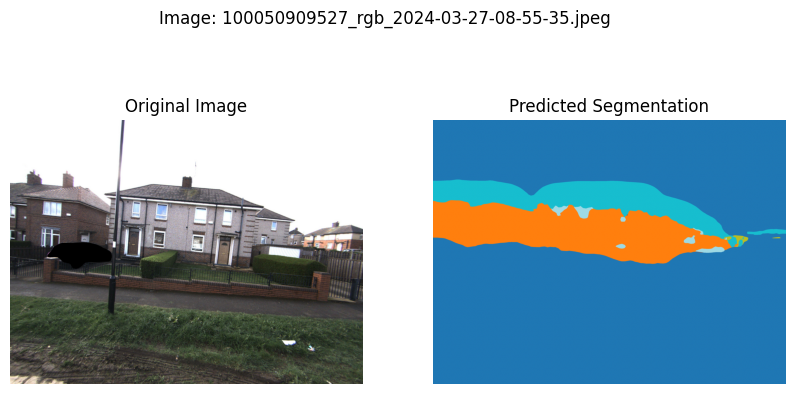

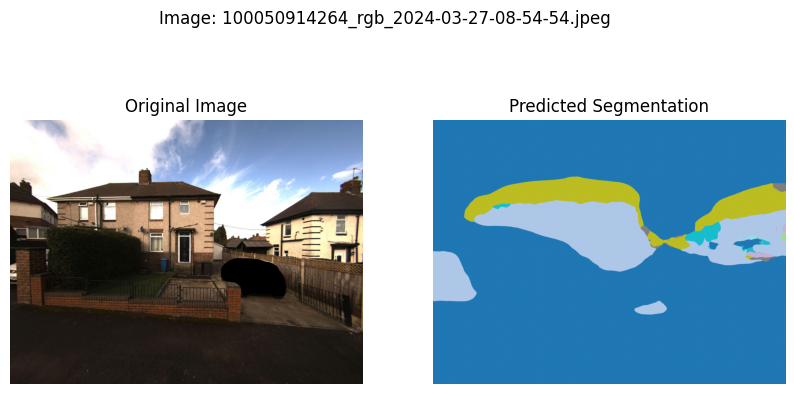

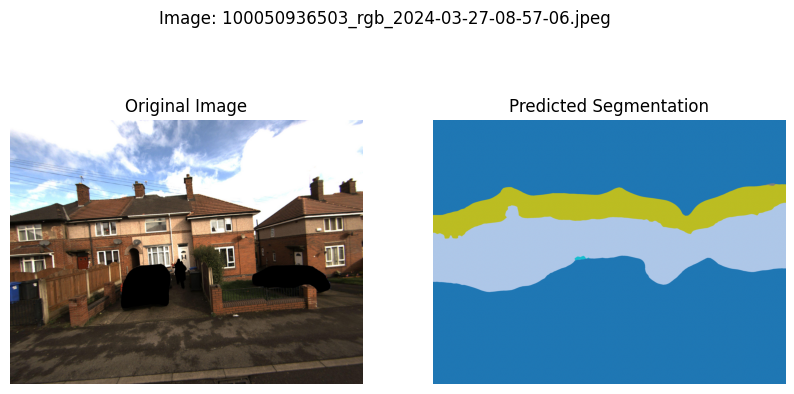

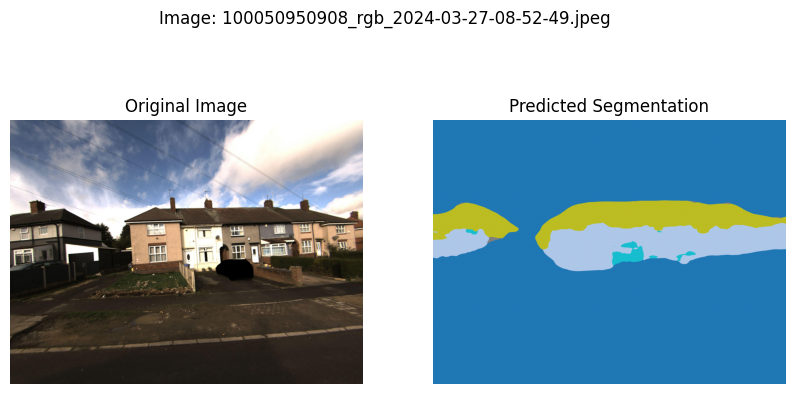

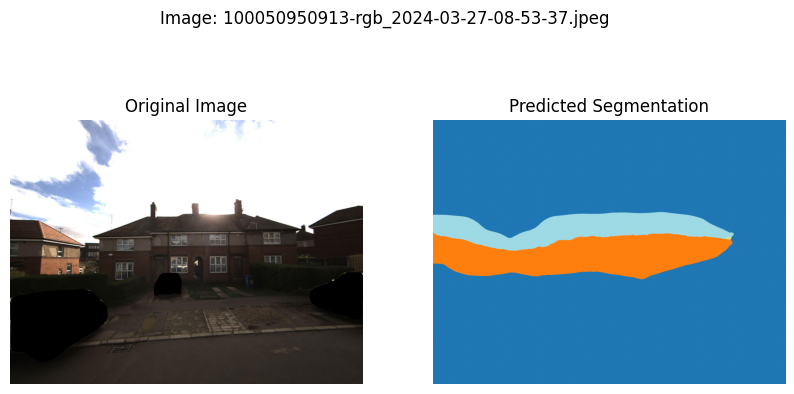

...

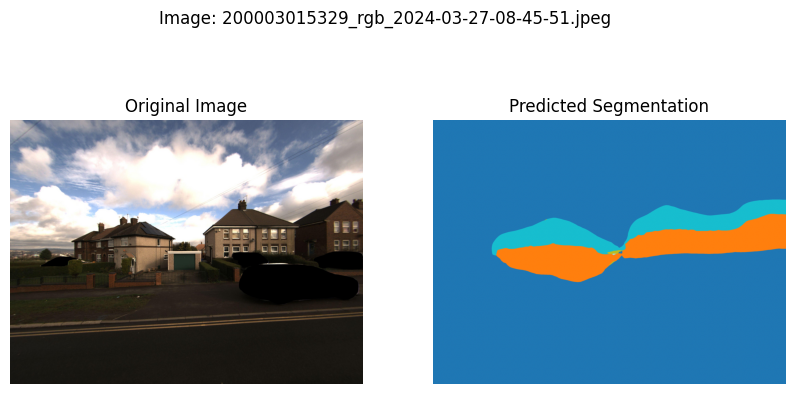

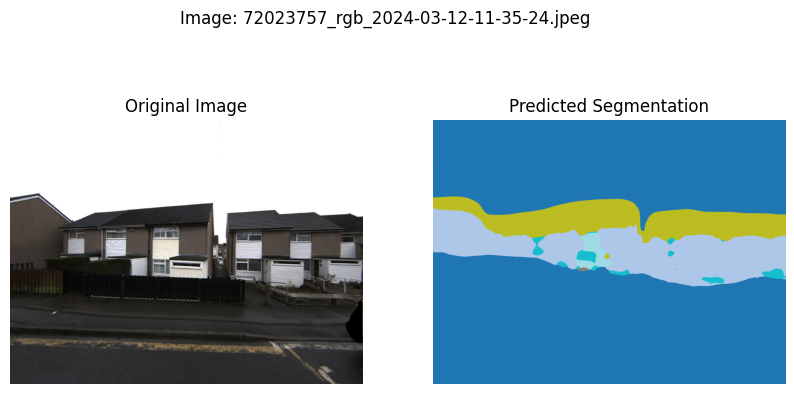

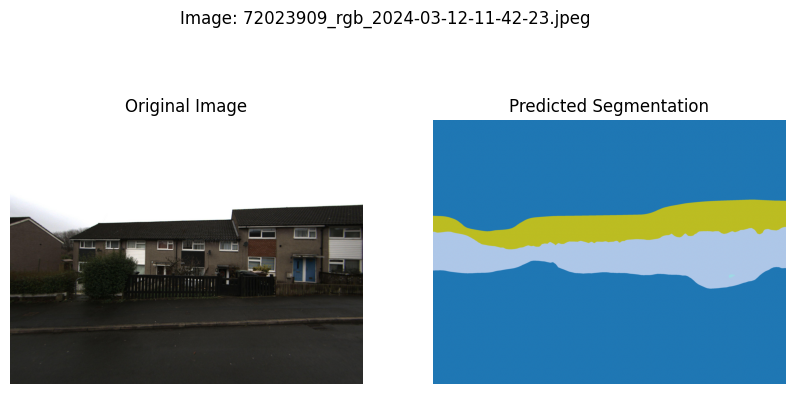

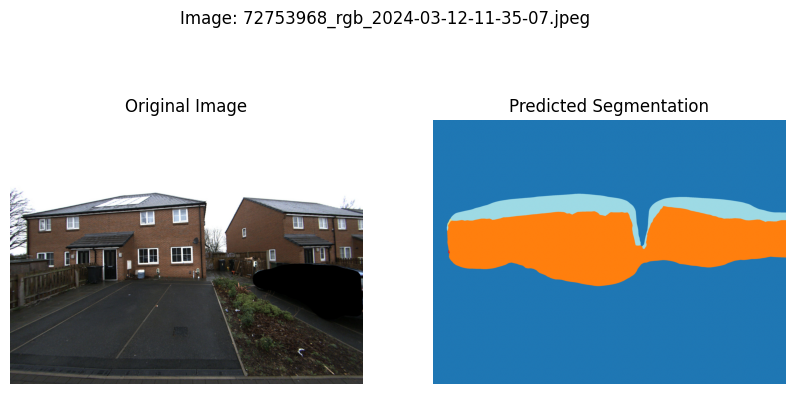

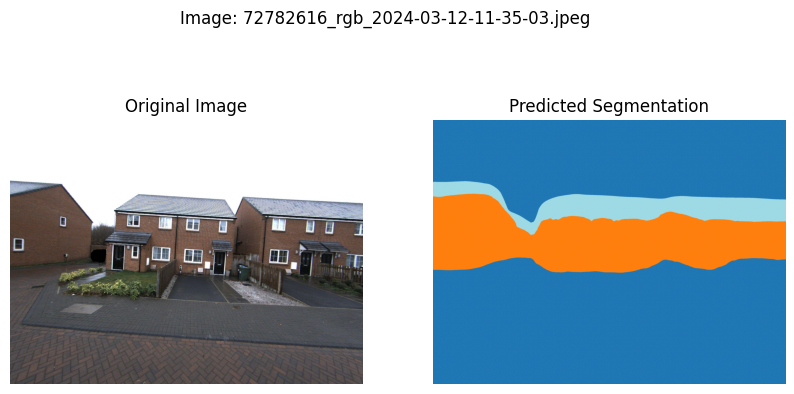

In [ ]:
import os
from PIL import Image
import torch.nn.functional as F
import matplotlib.pyplot as plt
from torchvision import transforms
import torchvision.transforms.functional as TF
import torch # Import torch

# Folder path
image_folder = "/content/drive/MyDrive/Manually_Labeled_Masks_seg_2/images/default" # Corrected typo
output_folder = "/content/drive/MyDrive/Manually_Labeled_Masks_seg_2/predicted_outputs"
os.makedirs(output_folder, exist_ok=True)

# Load and sort image files
image_files = sorted([
    f for f in os.listdir(image_folder) if f.lower().endswith(('.png', '.jpg', '.jpeg'))
])

# Define transform to match training
transform = transforms.Compose([
    transforms.Resize((512, 512)),
    transforms.ToTensor(),
])

model.eval()  # Make sure model is in eval mode

# Loop over all images
for img_name in image_files:
    img_path = os.path.join(image_folder, img_name)

    # Load and preprocess image
    image = Image.open(img_path).convert("RGB")
    image_resized = transform(image).unsqueeze(0).to(device)  # Shape: [1, 3, 512, 512]

    with torch.no_grad():
        output = model(pixel_values=image_resized)
        logits = output.logits
        logits_upsampled = F.interpolate(logits, size=image.size[::-1], mode='bilinear', align_corners=False)
        pred = torch.argmax(logits_upsampled.squeeze(), dim=0).cpu()

    # Visualize
    plt.figure(figsize=(10, 5))
    plt.suptitle(f"Image: {img_name}")

    plt.subplot(1, 2, 1)
    plt.title("Original Image")
    plt.imshow(image)
    plt.axis("off")

    plt.subplot(1, 2, 2)
    plt.title("Predicted Segmentation")
    plt.imshow(pred, cmap='tab20')
    plt.axis("off")

    plt.show()

Some weights of SegformerForSemanticSegmentation were not initialized from the model checkpoint at nvidia/segformer-b0-finetuned-ade-512-512 and are newly initialized because the shapes did not match:
- decode_head.classifier.bias: found shape torch.Size([150]) in the checkpoint and torch.Size([5]) in the model instantiated
- decode_head.classifier.weight: found shape torch.Size([150, 256, 1, 1]) in the checkpoint and torch.Size([5, 256, 1, 1]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch 1 - Train Loss: 1.5864
Epoch 1 - Val Loss: 1.5846 - IoU: 0.1045
✅ Saved new best model!


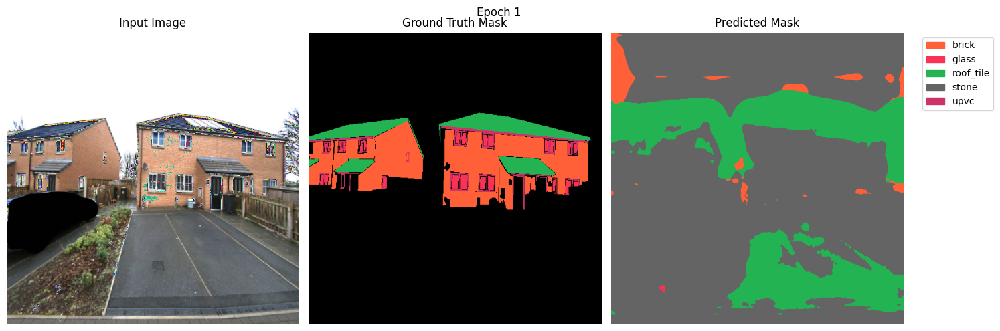

Epoch 2 - Train Loss: 1.4629
Epoch 2 - Val Loss: 1.5018 - IoU: 0.1513
✅ Saved new best model!


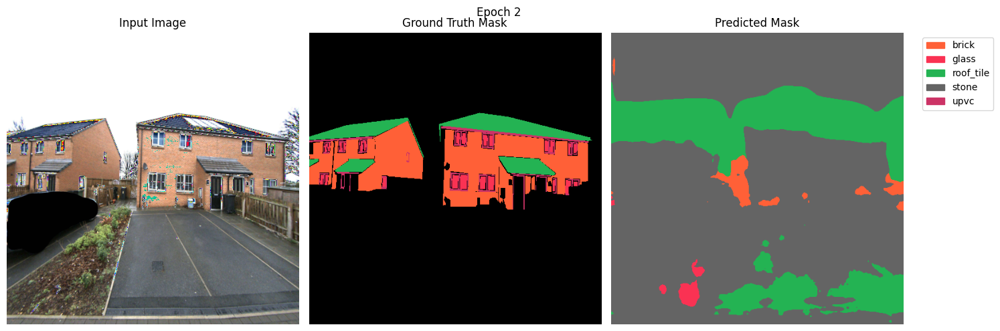

Epoch 3 - Train Loss: 1.3502
Epoch 3 - Val Loss: 1.4257 - IoU: 0.1921
✅ Saved new best model!


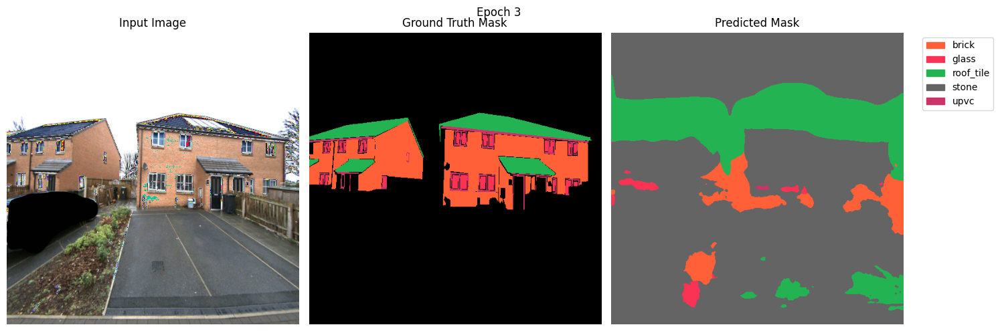

Epoch 4 - Train Loss: 1.2721
Epoch 4 - Val Loss: 1.3523 - IoU: 0.2450
✅ Saved new best model!


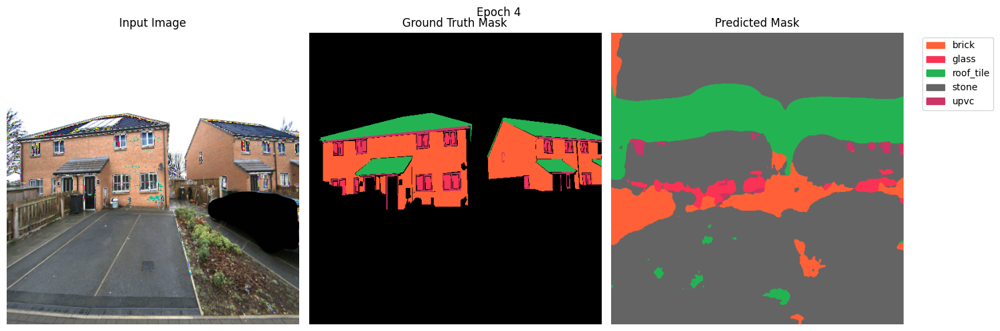

KeyboardInterrupt: 

In [ ]:
import os
import torch
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader, random_split
import torchvision.transforms as T
from transformers import SegformerForSemanticSegmentation, SegformerConfig
from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import numpy as np
import random
from collections import Counter

# ---------- Dataset ----------
class SegmentationDataset(Dataset):
    def __init__(self, image_dir, mask_dir, image_size=(512, 512), augment=True):
        self.image_dir = image_dir
        self.mask_dir = mask_dir
        self.image_size = image_size
        self.augment = augment

        self.images = sorted([f for f in os.listdir(image_dir) if os.path.isfile(os.path.join(image_dir, f))])
        self.masks = sorted([f for f in os.listdir(mask_dir) if os.path.isfile(os.path.join(mask_dir, f))])

        self.rgb_to_original_class_id = {
            (255, 96, 55): 1,    # brick
            (250, 50, 83): 4,    # glass
            (36, 179, 83): 9,    # roof_tile
            (89, 134, 179): 10,  # stone
            (204, 51, 102): 11   # upvc
        }

        self.original_to_remapped_class_id = {
            1: 0,   # brick
            4: 1,   # glass
            9: 2,   # roof_tile
            10: 3,  # stone
            11: 4   # upvc
        }

        self.num_classes = 5  # Only 5 foreground classes

        self.image_transform = T.Compose([
            T.Resize(image_size),
            T.ToTensor(),
            T.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
        ])

        self.mask_transform = T.Compose([
            T.Resize(image_size, interpolation=Image.NEAREST),
            T.PILToTensor()
        ])

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        img_path = os.path.join(self.image_dir, self.images[idx])
        mask_path = os.path.join(self.mask_dir, self.masks[idx])

        img = Image.open(img_path).convert("RGB")
        mask = Image.open(mask_path).convert("RGB")

        if self.augment and random.random() > 0.5:
            img = T.functional.hflip(img)
            mask = T.functional.hflip(mask)

        img = self.image_transform(img)

        # Convert RGB mask to class IDs
        mask_np = np.array(mask)
        original_target = np.zeros((mask_np.shape[0], mask_np.shape[1]), dtype=np.int64)
        for rgb, original_id in self.rgb_to_original_class_id.items():
            original_target[(mask_np == rgb).all(axis=2)] = original_id

        # Fill with ignore_index (255), overwrite only valid class areas
        remapped_target = np.full_like(original_target, fill_value=255, dtype=np.uint8)
        for original_id, remapped_id in self.original_to_remapped_class_id.items():
            remapped_target[original_target == original_id] = remapped_id

        mask_tensor = torch.from_numpy(remapped_target).long()
        mask_tensor_np = mask_tensor.numpy().astype(np.uint8)
        mask_tensor = self.mask_transform(Image.fromarray(mask_tensor_np)).squeeze(0).long()

        return img, mask_tensor

# ---------- Visualization ----------
def decode_segmap(mask, colormap):
    h, w = mask.shape
    rgb = np.zeros((h, w, 3), dtype=np.uint8)
    for class_id, color in colormap.items():
        rgb[mask == class_id] = color
    return rgb

def show_segmentation(image_tensor, mask_tensor, pred_tensor, class_labels, class_colors, epoch=None):
    image_np = T.functional.to_pil_image(image_tensor.cpu())
    gt_rgb = decode_segmap(mask_tensor.cpu().numpy(), class_colors)
    pred_rgb = decode_segmap(pred_tensor.cpu().numpy(), class_colors)

    plt.figure(figsize=(15, 5))
    for i, (title, img) in enumerate(zip(
        ["Input Image", "Ground Truth Mask", "Predicted Mask"],
        [image_np, gt_rgb, pred_rgb]
    )):
        plt.subplot(1, 3, i + 1)
        plt.imshow(img)
        plt.title(title)
        plt.axis("off")

    patches = [mpatches.Patch(color=np.array(color)/255.0, label=label)
               for _, (label, color) in class_labels.items()]
    plt.legend(handles=patches, bbox_to_anchor=(1.05, 1), loc='upper left')

    if epoch is not None:
        plt.suptitle(f"Epoch {epoch}")
    plt.tight_layout()
    plt.show()

# ---------- Metrics ----------
def compute_iou(preds, targets, num_classes):
    preds = preds.view(-1)
    targets = targets.view(-1)

    mask = targets != 255  # Ignore black/unlabeled pixels
    preds = preds[mask]
    targets = targets[mask]

    ious = []
    for cls in range(num_classes):
        intersection = ((preds == cls) & (targets == cls)).sum().item()
        union = ((preds == cls) | (targets == cls)).sum().item()
        if union > 0:
            ious.append(intersection / union)

    return np.mean(ious) if ious else 0.0

def compute_class_weights(dataloader, num_classes):
    pixel_counts = Counter()
    for _, masks in dataloader:
        masks = masks.view(-1)
        masks = masks[masks != 255]  # Exclude ignored pixels
        counts = torch.bincount(masks, minlength=num_classes)
        for cls, count in enumerate(counts.tolist()):
            pixel_counts[cls] += count
    total_pixels = sum(pixel_counts.values())
    return torch.tensor(
        [1.0 / (pixel_counts[cls] / total_pixels + 1e-6) for cls in range(num_classes)],
        dtype=torch.float
    )

# ---------- Paths ----------
image_dir = "/content/drive/MyDrive/Manually_Labeled_Masks_seg_2/images/default"
mask_dir = "/content/drive/MyDrive/Manually_Labeled_Masks_seg_2/SegmentationClass"
output_folder = "/content/drive/MyDrive/Manually_Labeled_Masks_seg_2/predicted_outputs_2"
os.makedirs(output_folder, exist_ok=True)

# ---------- Class Labels (0–4) ----------
class_labels = {
    0: ("brick", (255, 96, 55)),
    1: ("glass", (250, 50, 83)),
    2: ("roof_tile", (36, 179, 83)),
    3: ("stone", (100, 100, 100)),
    4: ("upvc", (204, 51, 102)),
}
class_colors = {k: v[1] for k, v in class_labels.items()}
num_classes = len(class_labels)

# ---------- Data ----------
dataset = SegmentationDataset(image_dir, mask_dir)
train_size = int(0.8 * len(dataset))
val_size = len(dataset) - train_size
train_dataset, val_dataset = random_split(dataset, [train_size, val_size])

train_loader = DataLoader(train_dataset, batch_size=4, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=4, shuffle=False)

# ---------- Model ----------
config = SegformerConfig.from_pretrained("nvidia/segformer-b0-finetuned-ade-512-512", num_labels=num_classes)
model = SegformerForSemanticSegmentation.from_pretrained(
    "nvidia/segformer-b0-finetuned-ade-512-512",
    config=config,
    ignore_mismatched_sizes=True
)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

# ---------- Training ----------
class_weights = compute_class_weights(train_loader, num_classes).to(device)
criterion = torch.nn.CrossEntropyLoss(weight=class_weights, ignore_index=255)
optimizer = torch.optim.AdamW(model.parameters(), lr=5e-5)

epochs = 30
best_val_loss = float('inf')

for epoch in range(epochs):
    model.train()
    total_train_loss = 0
    for imgs, masks in train_loader:
        imgs, masks = imgs.to(device), masks.to(device)

        outputs = model(pixel_values=imgs)
        logits = F.interpolate(outputs.logits, size=masks.shape[-2:], mode='bilinear', align_corners=False)

        loss = criterion(logits, masks)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        total_train_loss += loss.item()

    avg_train_loss = total_train_loss / len(train_loader)
    print(f"Epoch {epoch+1} - Train Loss: {avg_train_loss:.4f}")

    # ---------- Validation ----------
    model.eval()
    total_val_loss = 0
    iou_scores = []
    with torch.no_grad():
        for imgs, masks in val_loader:
            imgs, masks = imgs.to(device), masks.to(device)
            outputs = model(pixel_values=imgs)
            logits = F.interpolate(outputs.logits, size=masks.shape[-2:], mode='bilinear', align_corners=False)

            loss = criterion(logits, masks)
            total_val_loss += loss.item()

            preds = torch.argmax(logits, dim=1)
            iou_scores.append(compute_iou(preds, masks, num_classes))

    avg_val_loss = total_val_loss / len(val_loader)
    avg_iou = np.mean(iou_scores)
    print(f"Epoch {epoch+1} - Val Loss: {avg_val_loss:.4f} - IoU: {avg_iou:.4f}")

    if avg_val_loss < best_val_loss:
        best_val_loss = avg_val_loss
        torch.save(model.state_dict(), "best_segformer_model.pth")
        print("✅ Saved new best model!")

    sample_img = imgs[0]
    sample_mask = masks[0]
    sample_pred = torch.argmax(logits[0], dim=0)
    show_segmentation(sample_img, sample_mask, sample_pred, class_labels, class_colors, epoch=epoch+1)


Some weights of SegformerForSemanticSegmentation were not initialized from the model checkpoint at nvidia/segformer-b0-finetuned-ade-512-512 and are newly initialized because the shapes did not match:
- decode_head.classifier.bias: found shape torch.Size([150]) in the checkpoint and torch.Size([5]) in the model instantiated
- decode_head.classifier.weight: found shape torch.Size([150, 256, 1, 1]) in the checkpoint and torch.Size([5, 256, 1, 1]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch 1 - Train Loss: 1.6018
Epoch 1 - Val Loss: 1.5553 - IoU: 0.0783
✅ Saved new best model!


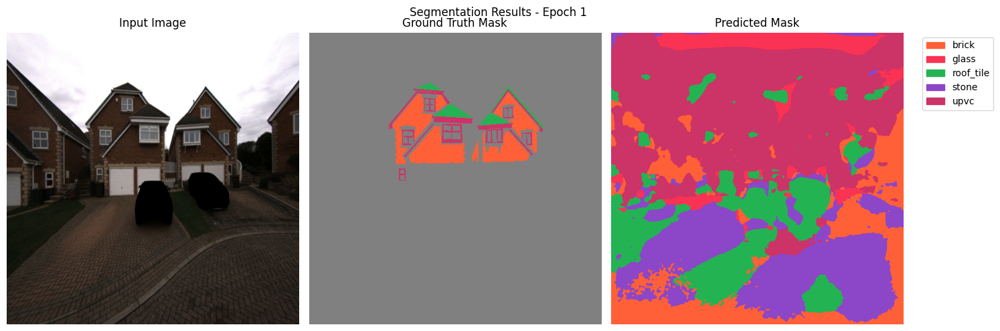

Epoch 2 - Train Loss: 1.4567
Epoch 2 - Val Loss: 1.4523 - IoU: 0.1717
✅ Saved new best model!


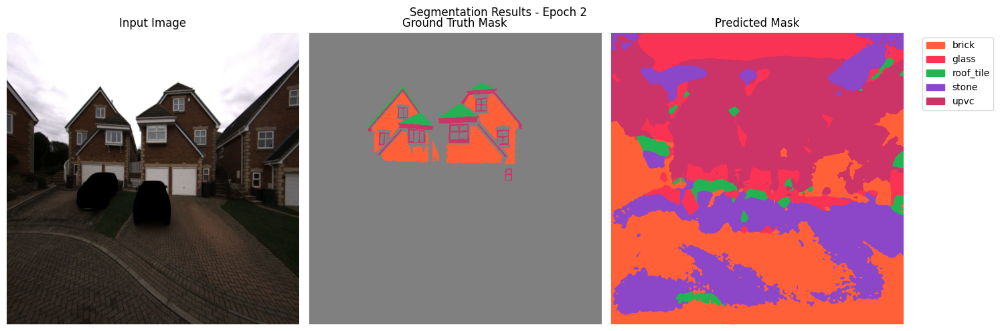

Epoch 3 - Train Loss: 1.3619
Epoch 3 - Val Loss: 1.3747 - IoU: 0.1837
✅ Saved new best model!


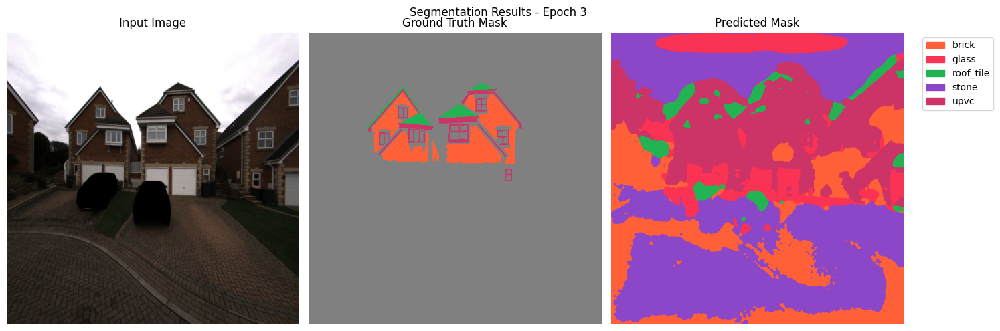

Epoch 4 - Train Loss: 1.2579
Epoch 4 - Val Loss: 1.2693 - IoU: 0.2479
✅ Saved new best model!


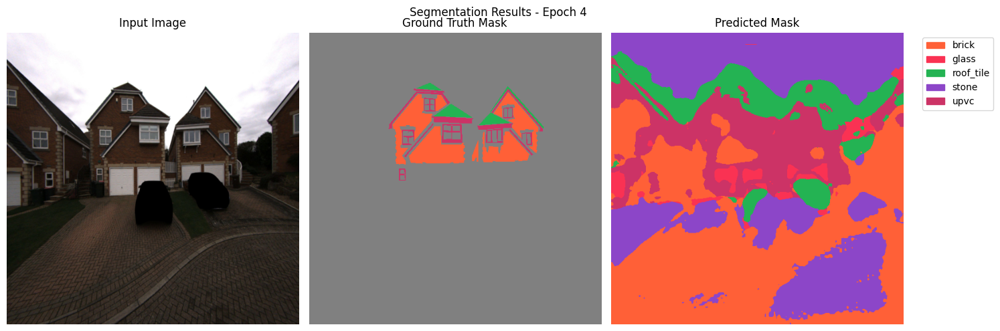

Epoch 5 - Train Loss: 1.1413
Epoch 5 - Val Loss: 1.1954 - IoU: 0.2984
✅ Saved new best model!


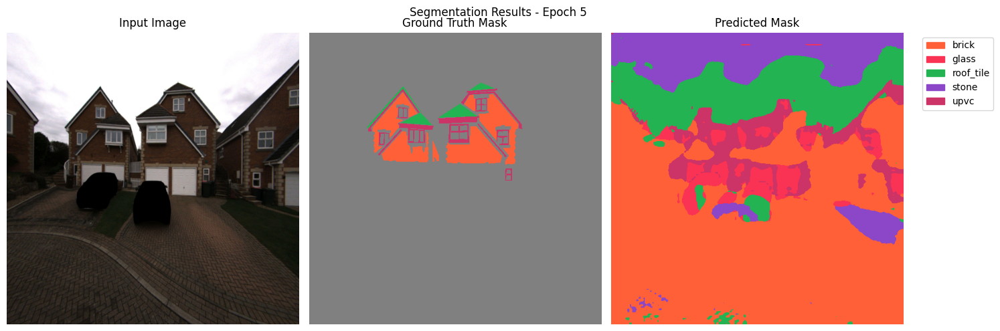

Epoch 6 - Train Loss: 1.0380
Epoch 6 - Val Loss: 1.1162 - IoU: 0.3125
✅ Saved new best model!


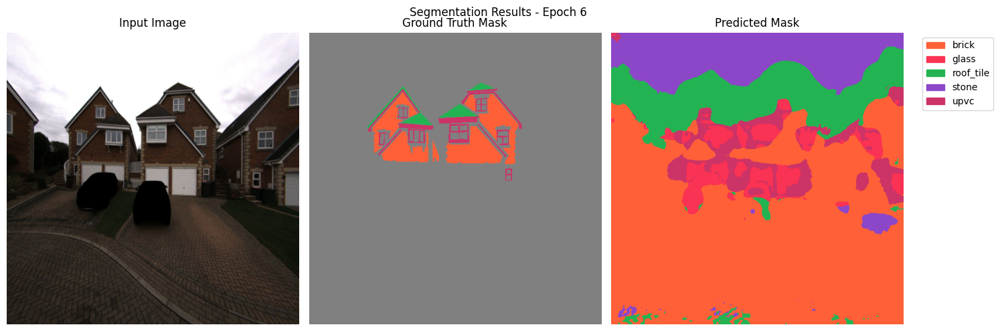

Epoch 7 - Train Loss: 0.9673
Epoch 7 - Val Loss: 1.0427 - IoU: 0.3436
✅ Saved new best model!


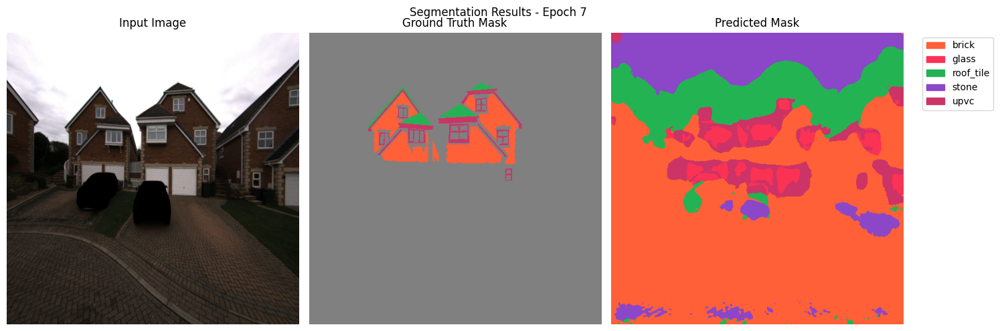

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



Traceback (most recent call last):
  File "/usr/local/lib/python3.11/dist-packages/IPython/core/interactiveshell.py", line 3553, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "/tmp/ipython-input-1936682678.py", line 218, in <cell line: 0>
    outputs = model(pixel_values=imgs)
              ^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.11/dist-packages/torch/nn/modules/module.py", line 1739, in _wrapped_call_impl
    return self._call_impl(*args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.11/dist-packages/torch/nn/modules/module.py", line 1750, in _call_impl
    return forward_call(*args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.11/dist-packages/transformers/models/segformer/modeling_segformer.py", line 730, in forward
    outputs = self.segformer(
              ^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.11/dist-packages/torch/nn/modules/module.py", line 1739, in 

TypeError: object of type 'NoneType' has no len()

In [ ]:
import os
import torch
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader, random_split
import torchvision.transforms as T
from transformers import SegformerForSemanticSegmentation, SegformerConfig
from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import numpy as np
import random
from collections import Counter

# ---------- Dataset ----------
class SegmentationDataset(Dataset):
    def __init__(self, image_dir, mask_dir, image_size=(512, 512), augment=True):
        self.image_dir = image_dir
        self.mask_dir = mask_dir
        self.image_size = image_size
        self.augment = augment

        self.images = sorted([f for f in os.listdir(image_dir) if os.path.isfile(os.path.join(image_dir, f))])
        self.masks = sorted([f for f in os.listdir(mask_dir) if os.path.isfile(os.path.join(mask_dir, f))])

        self.rgb_to_original_class_id = {
            (255, 96, 55): 1,    # brick
            (250, 50, 83): 4,    # glass
            (36, 179, 83): 9,    # roof_tile
            (140, 70, 200): 10,  # stone purple-ish - Added colon and value
            (204, 51, 102): 11   # upvc
        }

        self.original_to_remapped_class_id = {
            1: 0,
            4: 1,
            9: 2,
            10: 3,
            11: 4
        }

        self.num_classes = 5  # Only 5 foreground classes

        self.image_transform = T.Compose([
            T.Resize(image_size),
            T.ToTensor(),
            T.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
        ])

        self.mask_transform = T.Compose([
            T.Resize(image_size, interpolation=Image.NEAREST),
            T.PILToTensor()
        ])

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        img_path = os.path.join(self.image_dir, self.images[idx])
        mask_path = os.path.join(self.mask_dir, self.masks[idx])

        img = Image.open(img_path).convert("RGB")
        mask = Image.open(mask_path).convert("RGB")

        if self.augment and random.random() > 0.5:
            img = T.functional.hflip(img)
            mask = T.functional.hflip(mask)

        img = self.image_transform(img)

        # Convert RGB mask to class IDs
        mask_np = np.array(mask)
        original_target = np.zeros((mask_np.shape[0], mask_np.shape[1]), dtype=np.int64)
        for rgb, original_id in self.rgb_to_original_class_id.items():
            original_target[(mask_np == rgb).all(axis=2)] = original_id

        # Initialize all pixels to 255 (ignored)
        remapped_target = np.full_like(original_target, fill_value=255, dtype=np.uint8)
        for original_id, remapped_id in self.original_to_remapped_class_id.items():
            remapped_target[original_target == original_id] = remapped_id

        mask_tensor = self.mask_transform(Image.fromarray(remapped_target)).squeeze(0).long()
        return img, mask_tensor

# ---------- Visualization ----------

def unnormalize_image(tensor):
    """
    Undo normalization applied during preprocessing.
    Assumes mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5] normalization.
    """
    return tensor * 0.5 + 0.5  # maps [-1, 1] → [0, 1]

def decode_segmap(mask, colormap, ignore_value=255):
    """
    Converts a 2D mask of class indices into an RGB image using a colormap.
    """
    h, w = mask.shape
    rgb = np.full((h, w, 3), fill_value=128, dtype=np.uint8)  # neutral gray for ignore areas
    for class_id, color in colormap.items():
        rgb[mask == class_id] = color
    return rgb

def show_segmentation(image_tensor, mask_tensor, pred_tensor, class_labels, class_colors, epoch=None):
    """
    Visualize input image, ground truth mask, and predicted mask side by side.
    Ignores unlabeled regions (label=255).
    """
    image_np = T.functional.to_pil_image(unnormalize_image(image_tensor.cpu()))
    gt_np = mask_tensor.cpu().numpy()
    pred_np = pred_tensor.cpu().numpy()

    gt_rgb = decode_segmap(gt_np, class_colors)
    pred_rgb = decode_segmap(pred_np, class_colors)

    plt.figure(figsize=(15, 5))
    for i, (title, img) in enumerate(zip(
        ["Input Image", "Ground Truth Mask", "Predicted Mask"],
        [image_np, gt_rgb, pred_rgb]
    )):
        plt.subplot(1, 3, i + 1)
        plt.imshow(img)
        plt.title(title)
        plt.axis("off")

    # Color legend
    patches = [mpatches.Patch(color=np.array(color)/255.0, label=label)
               for _, (label, color) in class_labels.items()]
    plt.legend(handles=patches, bbox_to_anchor=(1.05, 1), loc='upper left')

    if epoch is not None:
        plt.suptitle(f"Segmentation Results - Epoch {epoch}")
    plt.tight_layout()
    plt.show()


# ---------- Metrics ----------
def compute_iou(preds, targets, num_classes):
    preds = preds.view(-1)
    targets = targets.view(-1)

    mask = targets != 255  # Ignore unlabeled pixels
    preds = preds[mask]
    targets = targets[mask]

    ious = []
    for cls in range(num_classes):
        intersection = ((preds == cls) & (targets == cls)).sum().item()
        union = ((preds == cls) | (targets == cls)).sum().item()
        if union > 0:
            ious.append(intersection / union)

    return np.mean(ious) if ious else 0.0

def compute_class_weights(dataloader, num_classes):
    pixel_counts = Counter()
    for _, masks in dataloader:
        masks = masks.view(-1)
        masks = masks[masks != 255]  # Ignore unlabeled pixels
        counts = torch.bincount(masks, minlength=num_classes)
        for cls, count in enumerate(counts.tolist()):
            pixel_counts[cls] += count
    total_pixels = sum(pixel_counts.values())
    return torch.tensor(
        [1.0 / (pixel_counts[cls] / total_pixels + 1e-6) for cls in range(num_classes)],
        dtype=torch.float
    )

# ---------- Config ----------
image_dir = "/content/drive/MyDrive/Manually_Labeled_Masks_seg_2/images/default"
mask_dir = "/content/drive/MyDrive/Manually_Labeled_Masks_seg_2/SegmentationClass"
output_folder = "/content/drive/MyDrive/Manually_Labeled_Masks_seg_2/predicted_outputs_3"
os.makedirs(output_folder, exist_ok=True)

class_labels = {
    0: ("brick", (255, 96, 55)),
    1: ("glass", (250, 50, 83)),
    2: ("roof_tile", (36, 179, 83)),
    3: ("stone", (140, 70, 200)),  # purple-ish
    4: ("upvc", (204, 51, 102)),
}
class_colors = {k: v[1] for k, v in class_labels.items()}
num_classes = len(class_labels)

# ---------- Data ----------
dataset = SegmentationDataset(image_dir, mask_dir)
train_size = int(0.8 * len(dataset))
val_size = len(dataset) - train_size
train_dataset, val_dataset = random_split(dataset, [train_size, val_size])

train_loader = DataLoader(train_dataset, batch_size=4, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=4, shuffle=False)

# ---------- Model ----------
config = SegformerConfig.from_pretrained("nvidia/segformer-b0-finetuned-ade-512-512", num_labels=num_classes)
model = SegformerForSemanticSegmentation.from_pretrained(
    "nvidia/segformer-b0-finetuned-ade-512-512",
    config=config,
    ignore_mismatched_sizes=True
)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

# ---------- Training ----------
class_weights = compute_class_weights(train_loader, num_classes).to(device)
criterion = torch.nn.CrossEntropyLoss(weight=class_weights, ignore_index=255)
optimizer = torch.optim.AdamW(model.parameters(), lr=5e-5)

epochs = 30
best_val_loss = float('inf')

for epoch in range(epochs):
    model.train()
    total_train_loss = 0
    for imgs, masks in train_loader:
        imgs, masks = imgs.to(device), masks.to(device)

        outputs = model(pixel_values=imgs)
        logits = F.interpolate(outputs.logits, size=masks.shape[-2:], mode='bilinear', align_corners=False)

        loss = criterion(logits, masks)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        total_train_loss += loss.item()

    avg_train_loss = total_train_loss / len(train_loader)
    print(f"Epoch {epoch+1} - Train Loss: {avg_train_loss:.4f}")

    # ---------- Validation ----------
    model.eval()
    total_val_loss = 0
    iou_scores = []
    with torch.no_grad():
        for imgs, masks in val_loader:
            imgs, masks = imgs.to(device), masks.to(device)
            outputs = model(pixel_values=imgs)
            logits = F.interpolate(outputs.logits, size=masks.shape[-2:], mode='bilinear', align_corners=False)

            loss = criterion(logits, masks)
            total_val_loss += loss.item()

            preds = torch.argmax(logits, dim=1)
            iou_scores.append(compute_iou(preds, masks, num_classes))

    avg_val_loss = total_val_loss / len(val_loader)
    avg_iou = np.mean(iou_scores)
    print(f"Epoch {epoch+1} - Val Loss: {avg_val_loss:.4f} - IoU: {avg_iou:.4f}")

    if avg_val_loss < best_val_loss:
        best_val_loss = avg_val_loss
        torch.save(model.state_dict(), "best_segformer_model.pth")
        print("✅ Saved new best model!")

    sample_img = imgs[0]
    sample_mask = masks[0]
    sample_pred = torch.argmax(logits[0], dim=0)
    show_segmentation(sample_img, sample_mask, sample_pred, class_labels, class_colors, epoch=epoch+1)